In [1]:
import pandas as pd
import numpy as np
import cv2
from pycocotools import mask as mask_util
import ast
import plotly.express as px
import plotly.graph_objects as go


In [71]:
TRACKING_CSV_FILE = "tracking_coco_dataset_results.csv"

In [3]:
df = pd.read_csv(TRACKING_CSV_FILE)

In [4]:
df.tail()

,Unnamed: 0,frame_number,x1,y1,x2,y2,instance_name,class_score,segmentation
31675,31681,17984,168.127151,51.894951,231.430374,166.046204,P6_Huddle,0.999384,"{'size': [550, 400], 'counts': 'X]k29j`06M2N3M..."
31676,31682,17984,141.965240,198.847961,208.477936,252.399353,P6_Lone,0.997014,"{'size': [550, 400], 'counts': 'l_\\23Qa04L5K5..."
31677,31683,17984,123.981216,170.681763,206.693802,250.485840,P6_Huddle,0.984398,"{'size': [550, 400], 'counts': 'fhR2c0b`03M2O0..."
31678,31684,17984,119.892960,159.339706,199.049545,219.811081,P6_Huddle,0.981494,"{'size': [550, 400], 'counts': 'RdP29l`03M3L4M..."
31679,31685,17984,120.100510,159.672409,199.628677,207.528030,P6_Lone,0.396990,"{'size': [550, 400], 'counts': 'RdP29l`02N3L5L..."


In [5]:
video_height, video_width = ast.literal_eval(df.iloc[0].segmentation)['size']

In [6]:
cx = (df.x1 + df.x2)/2
cy = (df.y1 + df.y2)/2
df['cx'] = cx
df['cy'] = cy

In [7]:
def mask_perimeter(mask):
    """calculate perimeter for a given binary mask
    """
    try:
        mask = mask_util.decode(mask)
    except TypeError:
        mask = ast.literal_eval(mask)
        rle = [mask]
        mask = mask_util.decode(rle)
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_CCOMP,
                           cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    perimeter = cv2.arcLength(cnt, True)
    return perimeter

In [8]:
df['mask_perimeter'] = df.segmentation.apply(mask_perimeter)

In [9]:
df = df[df.cx <= 360]

In [10]:
def mask_iou(this_mask, other_mask):
    """
    Calculate intersection over union between two masks.
    """
    try:
        _iou = mask_util.iou([this_mask],[other_mask],[False,False])
    except Exception:
        this_mask = ast.literal_eval(this_mask)
        other_mask = ast.literal_eval(other_mask)
        _iou = mask_util.iou([this_mask],[other_mask],[False,False])
    return _iou.flatten()[0]

In [11]:
def mask_area(mask):
    """Calulate the area of a RLE mask.
    """
    try:
        area = mask_util.area(mask)
    except TypeError:
        mask = ast.literal_eval(mask)
        area = mask_util.area(mask)
    return area

In [12]:
df['mask_area'] = df.segmentation.apply(mask_area)

In [13]:
mask_area_threshold=df[df.instance_name=='P6_Lone'].mask_area.mean()

In [14]:
mask_area_threshold

2060.674404761905

In [15]:
# remove P6_Lone instances with area of half size of average P6_Lone mask area
df = df[~(df.mask_area <= (mask_area_threshold /2))]

In [16]:
# remove P6_Huddle instances with mask area less than 2 times of the avarge area of P6_Lone
df = df[~((df.mask_area <= 2 * mask_area_threshold) & (df.instance_name == 'P6_Huddle'))]

In [17]:
# remove P6_Lone instances with mask area greater than the average area of the P6_Lone
df = df[~((df.instance_name == 'P6_Lone') & (df.mask_area > 2 * mask_area_threshold))]

In [18]:
# remove masks overlap
def overlaped_mask_ious(row, iou_threshold=0.2):
    frame_number = row.frame_number
    df_cur = df[df["frame_number"]==frame_number]
    masks = df_cur['segmentation'].values
    masks = [ast.literal_eval(mask) for mask in masks]
    ious = mask_util.iou(masks, masks, [False]*len(masks))
    ious[np.diag_indices_from(ious)] = 0
    ious_gt_thresh = (ious > iou_threshold)
    overlap_idxs = np.nonzero(np.tril(ious_gt_thresh))
    if len(overlap_idxs) < 1:
        return False
    if len(overlap_idxs[0]) < 1:
        return False
    overlap_idxs = [list(oi)[0] for oi in overlap_idxs]
    keep_index = df_cur.iloc[overlap_idxs].sort_values(by=['class_score'],ascending=False).head(1).index
    remove_index = set(overlap_idxs) - set(keep_index.to_list())
    
    if row['Unnamed: 0'] in df_cur.index[list(remove_index)].to_list(): 
        return True
    return False

In [19]:
def paired_mask_ious(frame_number):
    masks = df[df["frame_number"]==frame_number]['segmentation'].values
    masks = [ast.literal_eval(mask) for mask in masks]
    ious = mask_util.iou(masks, masks, [False]*len(masks))
    ious[np.diag_indices_from(ious)] = 0
    ious = np.sum(np.nonzero(np.tril(ious)))
    return ious

In [20]:
df['ious'] = df.frame_number.apply(paired_mask_ious)

In [21]:
#Please pick a value between 0 and 1
iou_threshold=0.2

In [22]:
df['is_removed'] = df.apply(lambda row: overlaped_mask_ious(row,iou_threshold),axis=1)

In [23]:
df_final = df.drop(df[df.is_removed==True].index)

In [24]:
print(f"Removed {len(df)-len(df_final)} overlapping predictions")

Removed 1693 overlapping predictions


In [25]:
df_final.to_csv(TRACKING_CSV_FILE.replace('.csv','_remove_overlapped.csv'))

In [26]:
df_final.tail()

,Unnamed: 0,frame_number,x1,y1,x2,y2,instance_name,class_score,segmentation,cx,cy,mask_perimeter,mask_area,ious,is_removed
31670,31676,17981,123.380951,165.631851,205.149383,248.839066,P6_Huddle,0.998856,"{'size': [550, 400], 'counts': 'VXR27l`06K3J5N...",164.265167,207.235458,272.793937,4440,0,False
31671,31677,17982,122.768295,166.569977,207.342941,254.971313,P6_Huddle,0.999735,"{'size': [550, 400], 'counts': 'oWR2=h`02N2M3N...",165.055618,210.770645,276.107644,4979,0,False
31673,31679,17983,120.609917,157.871933,207.190125,257.833496,P6_Huddle,0.999645,"{'size': [550, 400], 'counts': ']UQ2=g`03M4M3M...",163.900021,207.852715,402.918827,4941,0,False
31676,31682,17984,141.965240,198.847961,208.477936,252.399353,P6_Lone,0.997014,"{'size': [550, 400], 'counts': 'l_\\23Qa04L5K5...",175.221588,225.623657,204.166521,2178,0,False
31679,31685,17984,120.100510,159.672409,199.628677,207.528030,P6_Lone,0.396990,"{'size': [550, 400], 'counts': 'RdP29l`02N3L5L...",159.864593,183.600220,223.580734,2400,0,False


In [27]:
df_final[df_final.frame_number == 11607]

,Unnamed: 0,frame_number,x1,y1,x2,y2,instance_name,class_score,segmentation,cx,cy,mask_perimeter,mask_area,ious,is_removed
18483,18484,11607,144.940888,174.406677,237.550171,270.135651,P6_Huddle,0.999188,"{'size': [550, 400], 'counts': '_V_23c`0d0]Oa0...",191.245529,222.271164,369.563488,6298,0,False
18484,18485,11607,116.678131,145.657623,150.382233,239.072754,P6_Lone,0.997566,"{'size': [550, 400], 'counts': 'UQo17l`06J6C=F...",133.530182,192.365189,212.225396,2101,0,False


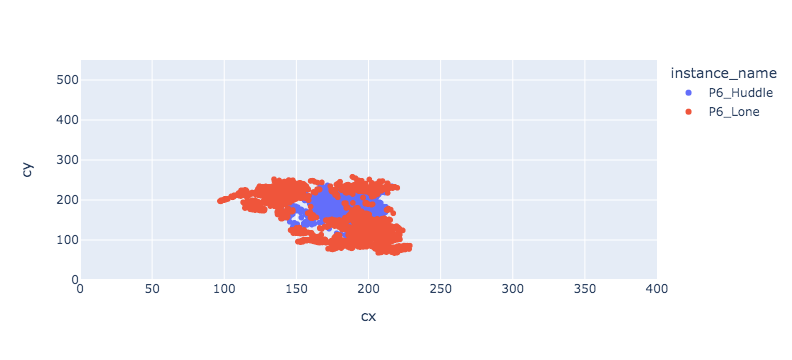

In [28]:
fig = px.scatter(df_final, 
                 x="cx",
                 y="cy", 
                 range_x=[0,video_width],
                 range_y=[0,video_height],
                 color="instance_name",
                 hover_data=['frame_number','cx','cy'])
fig.show()

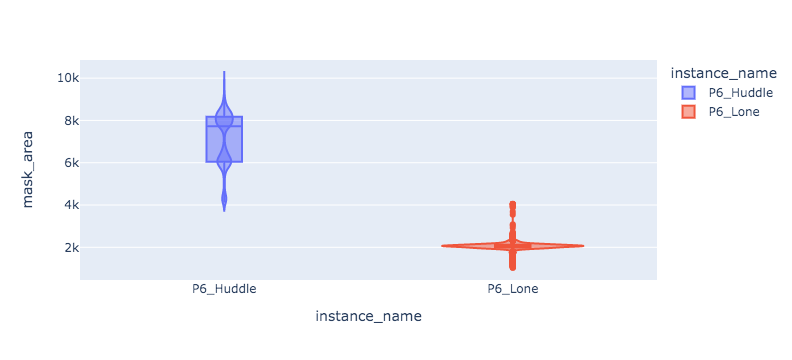

In [30]:
fig2 = px.violin(df_final, 
                 x='instance_name',
                 y="mask_area",
                 box=True,
                 color="instance_name",
                 points="outliers",
                 hover_data=['frame_number','cx','cy','mask_perimeter']
               )
fig2.show()

In [31]:
FPS = 30

In [35]:
df_final['time_in_seconds'] = df_final.frame_number / FPS

In [49]:
%matplotlib inline

In [65]:
df_final_sec = df_final.groupby(['instance_name'])['frame_number'].count() / FPS 

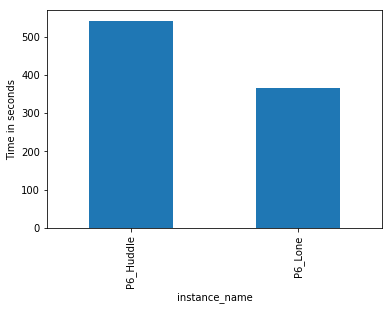

In [70]:
df_final_sec.plot.bar(ylabel='Time in seconds')

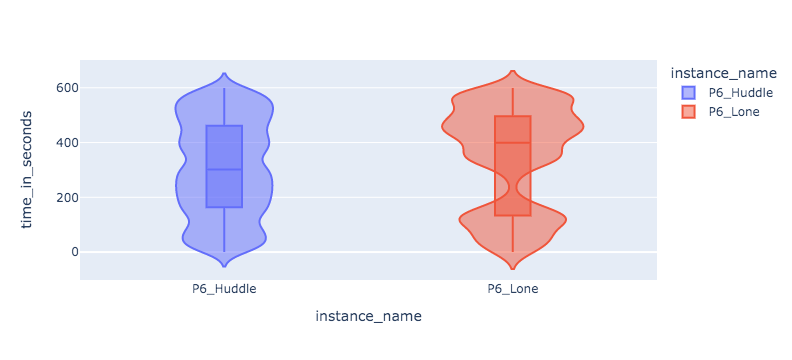

In [36]:
fig3 = px.violin(df_final, 
                 x='instance_name',
                 y="time_in_seconds",
                 box=True,
                 color="instance_name",
                 points="outliers",
                 hover_data=['frame_number','cx','cy','mask_perimeter']
               )
fig3.show()